In [1]:
import pyart
import matplotlib.pyplot as plt
from matplotlib import ticker, colors
import numpy as np
import os
from JSAnimation import IPython_display
from JSAnimation.IPython_display import display_animation

from matplotlib.animation import FuncAnimation, writers

%matplotlib inline


In [2]:
indir = '/data/right_now_I6/'
all_files = os.listdir(indir)
ppis = []
for fl in all_files:
    if 'X' in fl and os.stat(os.path.join(indir, fl)).st_size > 900000:
        ppis.append(os.path.join(indir, fl))
ppis.sort()

In [3]:
print ppis

['/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730120741.RAW2YN8.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730121741.RAW2YN9.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730122741.RAW2YNA.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730123741.RAW2YNB.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730124741.RAW2YNC.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.131201.mnt.XNW150730125741.RAW2YND.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt.XNW150730130742.RAW2YNE.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt.XNW150730131741.RAW2YNF.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt.XNW150730132741.RAW2YNG.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt.XNW150730133741.RAW2YNH.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt.XNW150730134740.RAW2YNJ.maint', '/data/right_now_I6/sgpxsaprI6.00.20150730.141201.mnt

In [4]:
radar = pyart.io.read(ppis[5])

In [5]:
print(pyart.util.datetime_utils.datetimes_from_radar(radar)[0])

2015-07-30 12:57:42.621000


In [6]:
print(radar.fields.keys())

['differential_phase', 'cross_correlation_ratio', 'normalized_coherent_power', 'spectrum_width', 'total_power', 'reflectivity', 'differential_reflectivity', 'specific_differential_phase', 'velocity']


(0, 15)

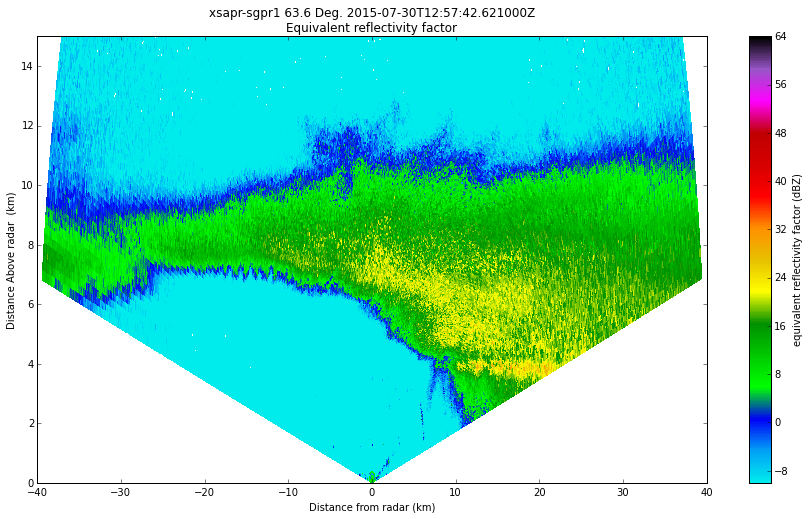

In [7]:
display = pyart.graph.RadarDisplay(radar)
fig = plt.figure(figsize = [15,8])
display.plot_rhi('reflectivity', sweep = 0,
                    vmin = -10, vmax = 64, mask_outside = False,
                    cmap = pyart.graph.cm.NWSRef)
plt.ylim([0,15])


(0, 15)

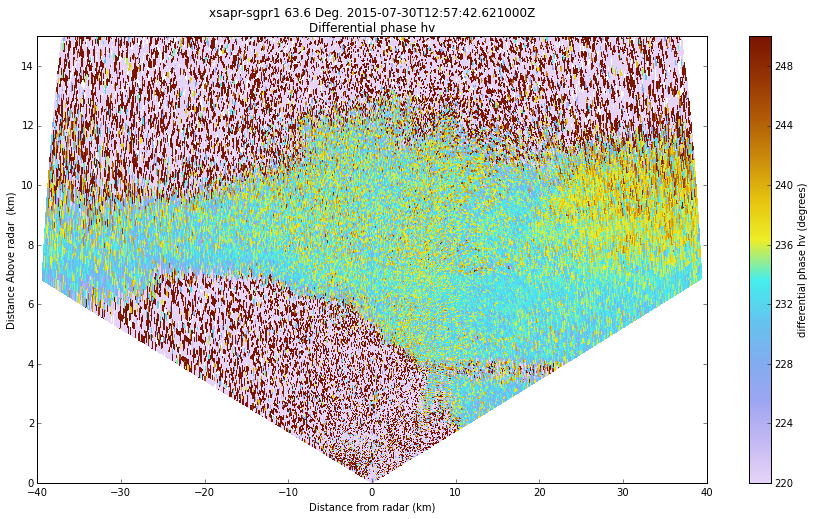

In [8]:
display = pyart.graph.RadarDisplay(radar)
fig = plt.figure(figsize = [15,8])
display.plot_rhi('differential_phase', sweep = 0,
                    vmin = 220, vmax = 250, mask_outside = False,
                    cmap =  pyart.graph.cm.LangRainbow12)
plt.ylim([0,15])


In [9]:
phidp_text = pyart.retrieve.texture_of_complex_phase(radar)
radar.add_field('differential_phase_texture', phidp_text, replace_existing = True)

(0, 15)

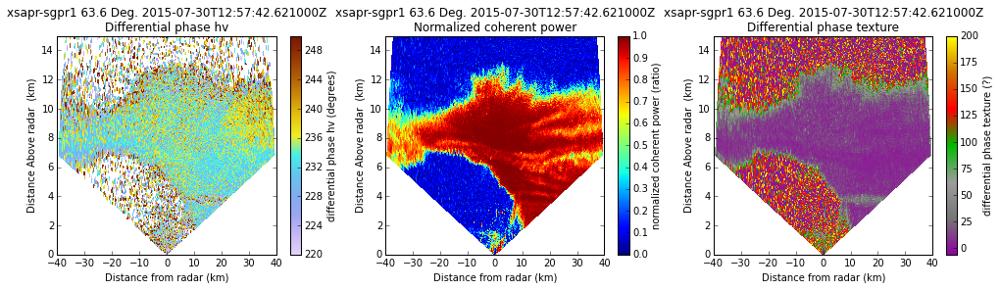

In [10]:
#create an instance of the class using our radar
display = pyart.graph.RadarDisplay(radar)
#create a Matplotlib figure
f = plt.figure(figsize = [17,4])
#now we are going to do a three panel plot, resolution is a basemap parameter and determines the resolution of 
#the coastline.. here we set to intermediate or 'i' ('h' for high 'l' for low)
plt.subplot(1, 3, 1) 
display.plot_rhi('differential_phase', sweep = 0, vmin = 220, vmax = 250, 
                     cmap = pyart.graph.cm.LangRainbow12)
plt.ylim([0,15])
plt.subplot(1, 3, 2) 
display.plot_rhi('normalized_coherent_power', sweep = 0, vmin = 0, vmax = 1)
plt.ylim([0,15])
plt.subplot(1, 3, 3) 
display.plot_rhi('differential_phase_texture', sweep = 0, vmax = 200,
                     cmap = pyart.graph.cm.NWS_SPW)
plt.ylim([0,15])

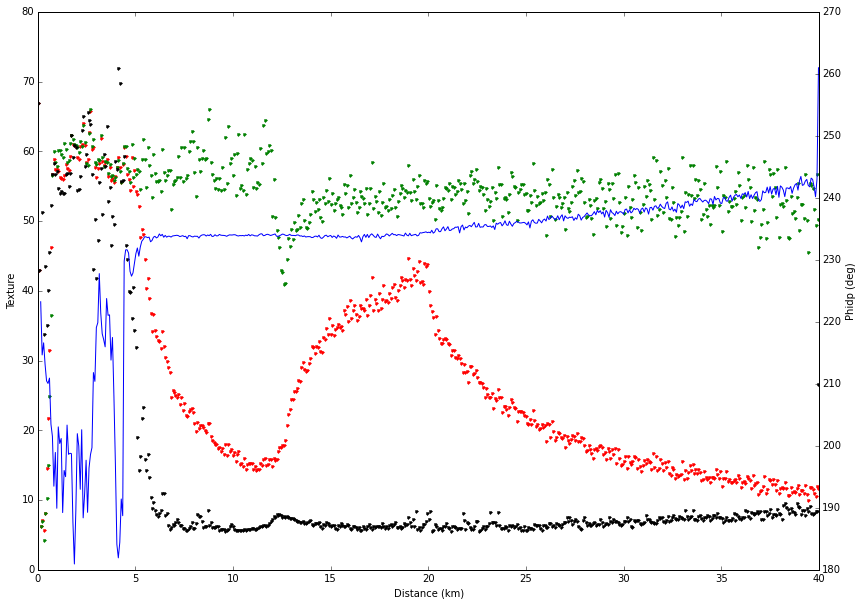

In [11]:
ncp_array = radar.fields['normalized_coherent_power']['data']
w_texture_complex = radar.fields['differential_phase_texture']['data']
w_texture_phidp_filt = np.ma.masked_where(ncp_array > .5, w_texture_complex )
w_texture_phidp_good = np.ma.masked_where(ncp_array < .5, w_texture_complex )

mean_text_range_filt = w_texture_phidp_filt.mean(axis=0)
mean_text_range = w_texture_complex.mean(axis=0)
mean_text_range_good = w_texture_phidp_good.mean(axis=0)
ranges = radar.range['data']/1000.0
fig = plt.figure(figsize = [14,10])
plt.plot(ranges, mean_text_range/2.0, 'r.')
plt.plot(ranges, mean_text_range_filt/2.0, 'g.')
plt.plot(ranges, mean_text_range_good/2.0, 'k.')
plt.xlabel('Distance (km)')
plt.ylabel('Texture')
plt.twinx()

good_phidp = np.ma.masked_where(w_texture_complex > 25, radar.fields['differential_phase']['data'])

plt.plot(ranges, good_phidp.mean(axis=0))
plt.ylabel('Phidp (deg)')

<matplotlib.colorbar.Colorbar instance at 0x10cf26f38>

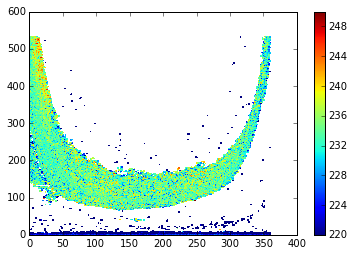

In [12]:
plt.pcolor(good_phidp[0:360, :].transpose(),  vmin = 220, vmax = 250)
plt.colorbar()

In [21]:
#kwrgsss = {'sweep' : 3, 'min_lon' : min_lon, 'max_lon' : max_lon, 
#           'min_lat' : min_lat, 'max_lat' : max_lat, 'resolution' : 'l'}
kwrgsss = {'sweep' : 0, 'mask_outside' : False}


def update_radar(n):
    global fig, ax1, sx2, ax3, ax4, cmap
    display = pyart.graph.RadarDisplay( pyart.io.read(ppis[n]))
    ax1.cla()
    display.plot_rhi('differential_reflectivity', 
                         vmin = -1, vmax = 5, colorbar_flag = False, ax = ax1, **kwrgsss)
    ax1.set_ylim([0,15])
    ax2.cla()
    display.plot_rhi('reflectivity',vmin = -8, vmax = 64,
                         colorbar_flag = False, ax = ax2,
                         cmap = pyart.graph.cm.NWSRef, **kwrgsss)
    ax2.set_ylim([0,15])
    ax3.cla()
    display.plot_rhi('differential_phase', vmin = 200, vmax = 300, cmap = pyart.graph.cm.LangRainbow12,
                         colorbar_flag = False, ax = ax3, **kwrgsss)
    ax3.set_ylim([0,15])
    ax4.cla()
    display.plot_rhi('cross_correlation_ratio', vmin = 0, vmax = 1,
                         colorbar_flag = False, ax = ax4,**kwrgsss)
    ax4.set_ylim([0,15])
    

   

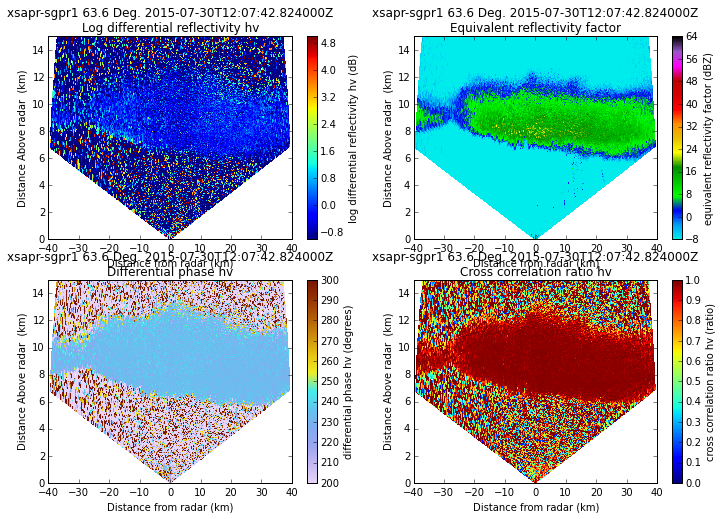

In [22]:
display = pyart.graph.RadarMapDisplay(pyart.io.read(ppis[0]))
fig = plt.figure(figsize = [12,8])
ax1 = plt.subplot(2, 2, 1) 
display.plot_rhi('differential_reflectivity', vmin = -1, vmax = 5, **kwrgsss)
plt.ylim([0,15])
cbax=plt.gca()
ax2 = plt.subplot(2, 2, 2); display.plot_rhi('reflectivity',vmin = -8, vmax = 64, cmap = pyart.graph.cm.NWSRef,
                                                 **kwrgsss)
plt.ylim([0,15])
ax3 = plt.subplot(2, 2, 3); display.plot_rhi('differential_phase', vmin = 200, vmax = 300, 
                                             cmap = pyart.graph.cm.LangRainbow12, **kwrgsss)
plt.ylim([0,15])
ax4 = plt.subplot(2, 2, 4); display.plot_rhi('cross_correlation_ratio', vmin = 0, vmax = 1, **kwrgsss)
plt.ylim([0,15])
anim = FuncAnimation(fig, update_radar, interval=500, frames= len(ppis))


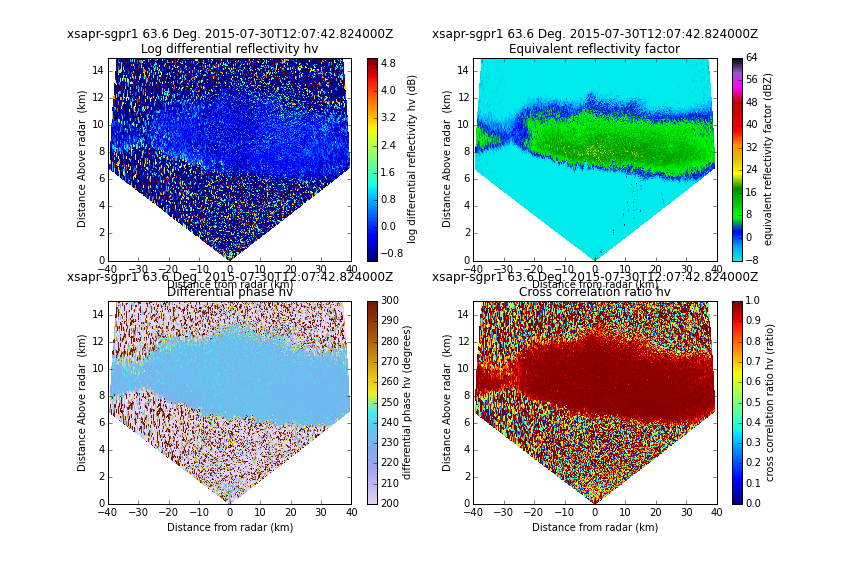
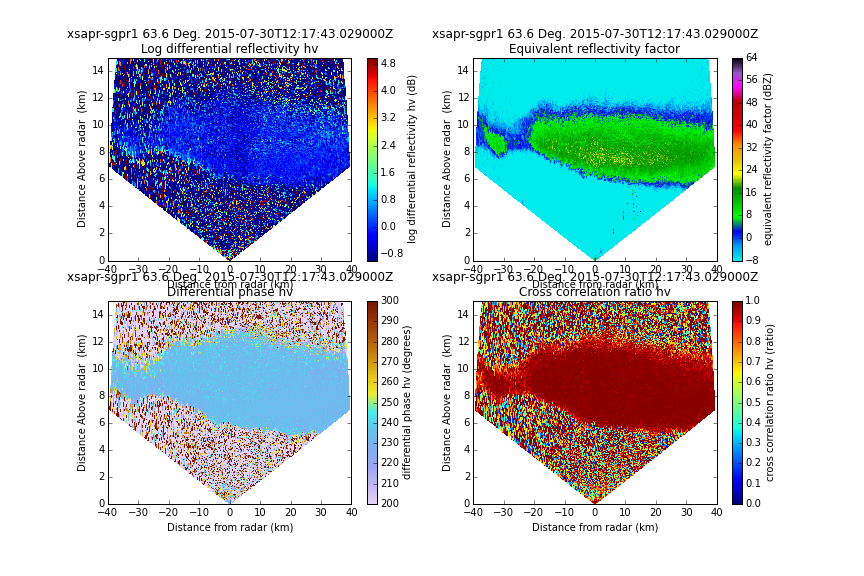
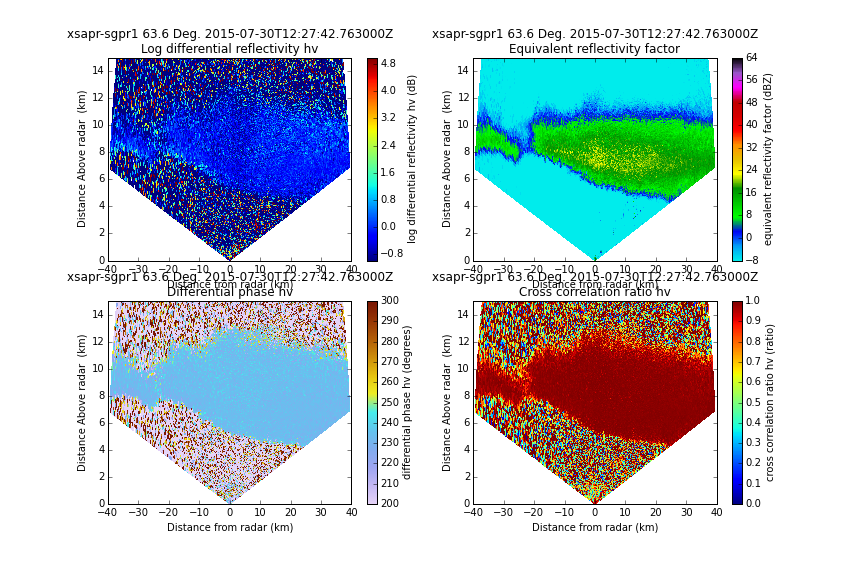
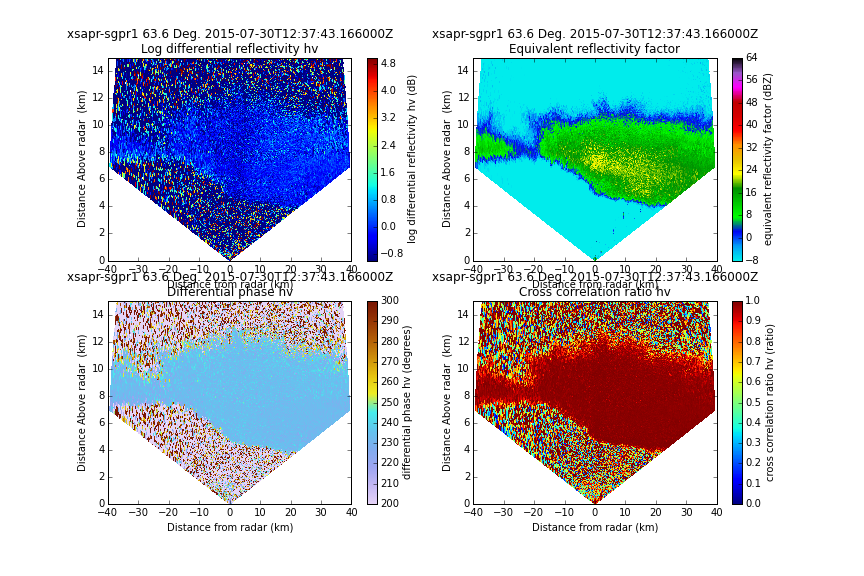
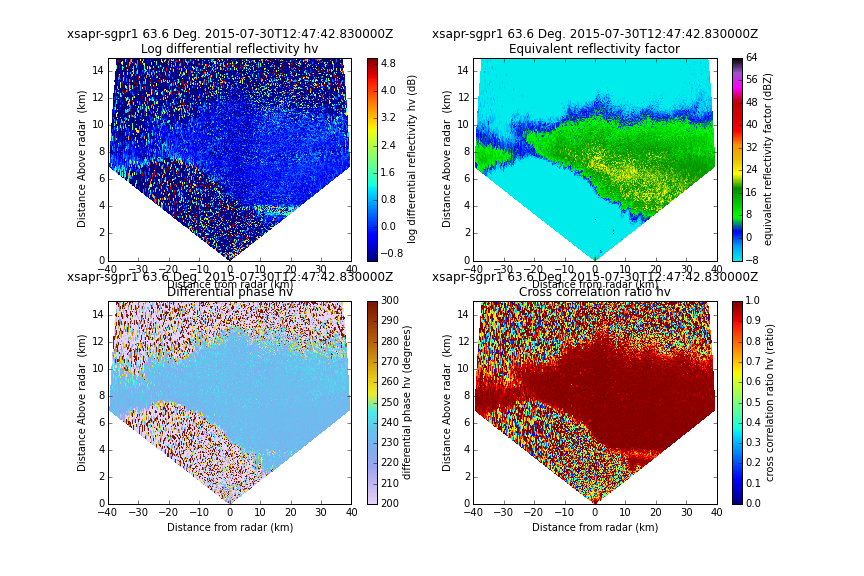
...
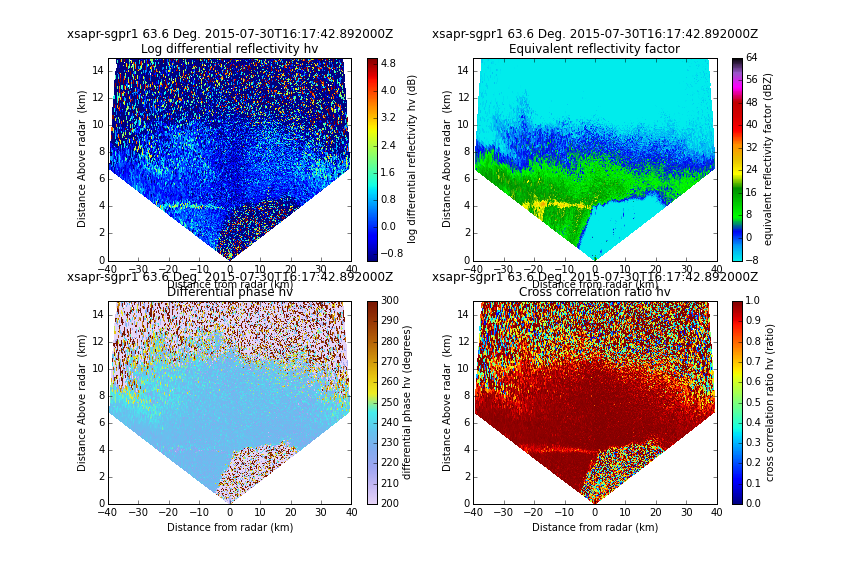
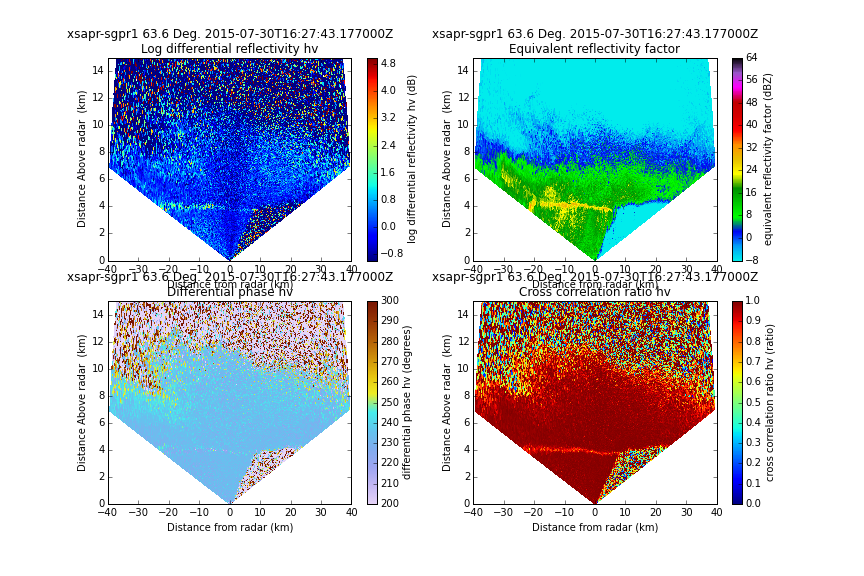
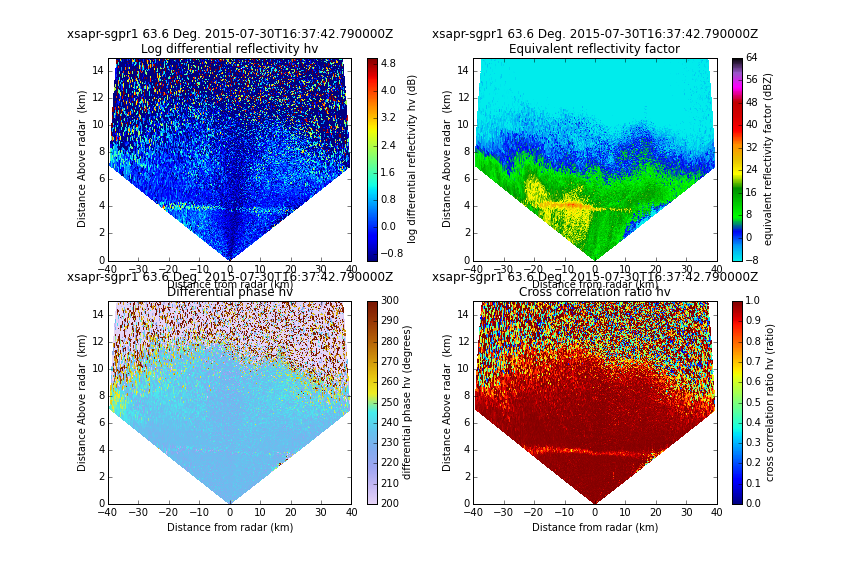
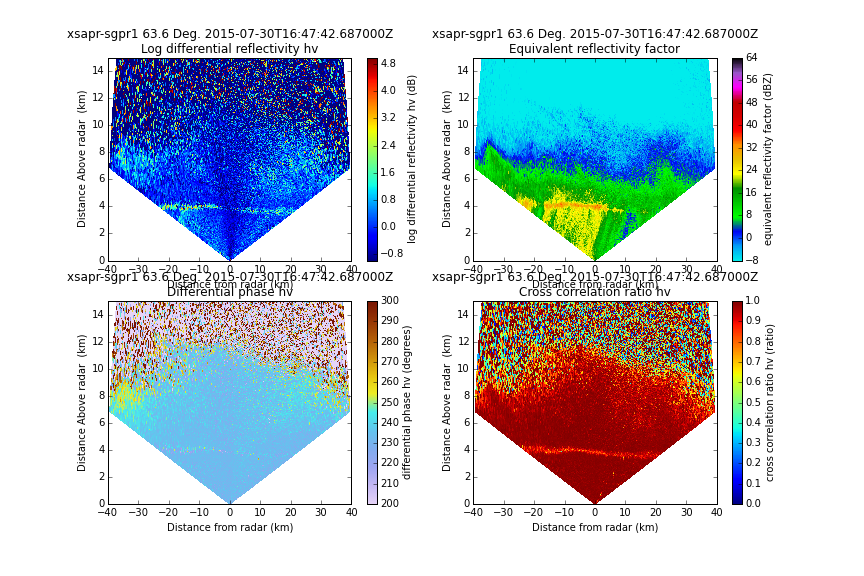
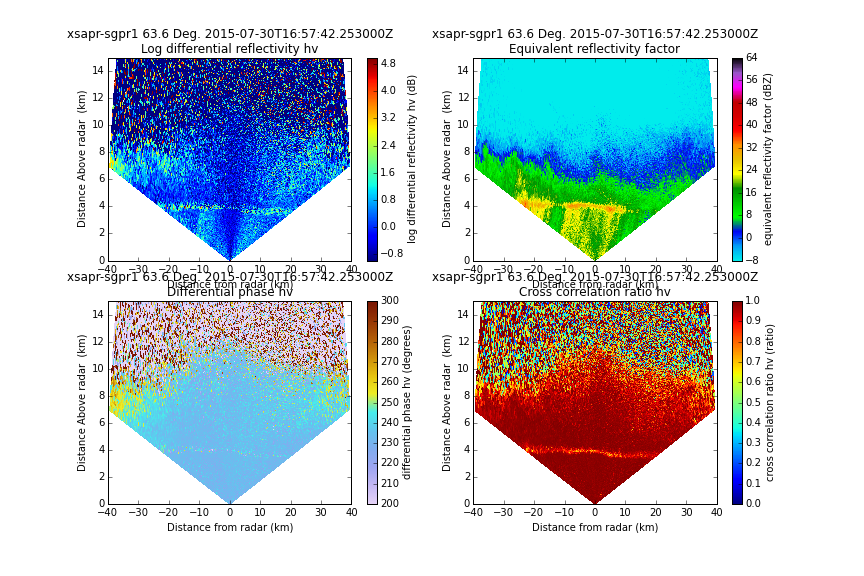

In [23]:
display_animation(anim, default_mode='once')

In [24]:
Writer = writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

anim.save('./xsapri6_rhi.mp4', fps=5, extra_args=['-vcodec', 'libx264'], writer=writer)

9.93164


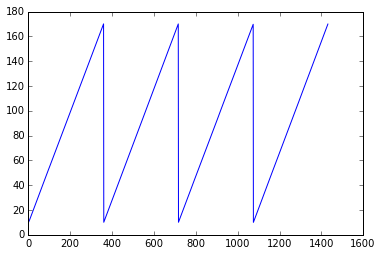

In [26]:
plt.plot(radar.elevation['data'])
print(radar.elevation['data'].min())